# Cassava Disease Classifier - Data Wrangling, EDA, and Feature Engineering

In [1]:
# import packages
import numpy as np
import os
import pandas as pd 
import pathlib
import PIL
import PIL.Image
import matplotlib.pyplot  as plt
from sklearn.utils import shuffle

import tensorflow as tf 
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
#style stuff
from matplotlib import rcParams

rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']
rcParams['axes.grid']=False
rcParams['xtick.minor.visible']=True
rcParams['ytick.minor.visible']=True
rcParams['xtick.direction']='in'
rcParams['ytick.direction']='in'

def set_plot(size):
    plt.rc('axes', titlesize=size)  # fontsize of the axes title
    plt.rc('axes', labelsize=size)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=size*0.8)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=size*0.8)    # fontsize of the tick labels

In [3]:
print("tensorflow version:", tf.__version__)
print("pillow version:", PIL.__version__)

tensorflow version: 2.0.0
pillow version: 8.0.0


In [4]:
#create data directory path and count images
data_dir = pathlib.Path('../data/external/')

print("There are", len(list(data_dir.glob('train_images/*.jpg'))), "training images and", 
      len(list(data_dir.glob('test_images/*.jpg'))), "test images.")

There are 21397 training images and 1 test images.


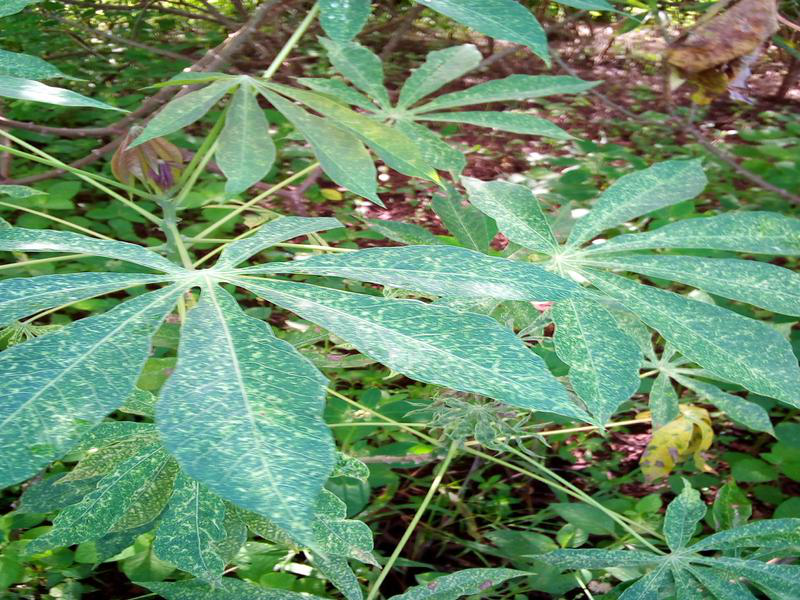

In [5]:
#Look at a few training images - load a list of image paths 
train_images = list(data_dir.glob('train_images/*.jpg'))

#display first training image
PIL.Image.open(str(train_images[0]))

This image appears to be of a diseased cassava plant, based on the mottling.

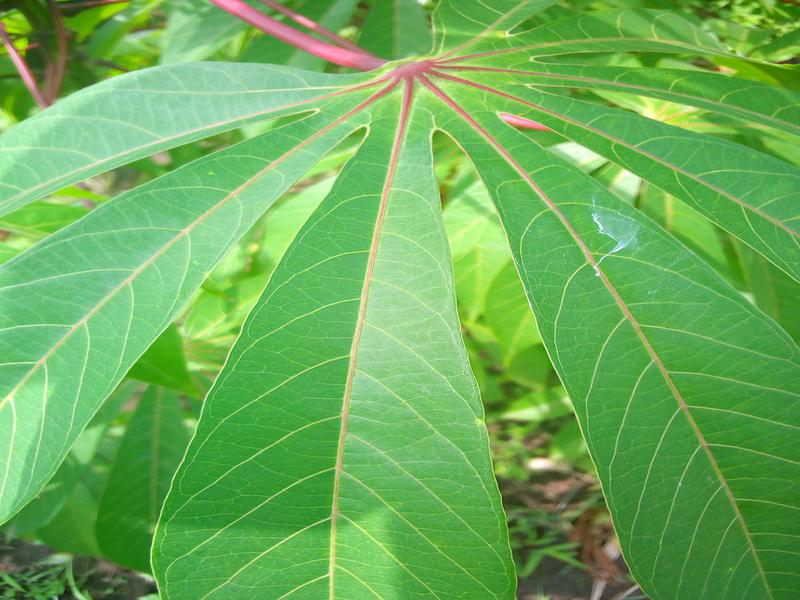

In [6]:
PIL.Image.open(str(train_images[5]))

This image appears to be a healthy cassava plant.

In [7]:
#let's take a look at image sizes
sizes = []

for i in range(len(train_images)):
    size = PIL.Image.open(str(train_images[i])).size
    sizes.append(size) 
    
print("Set of possible image sizes:", set(sizes))

Set of possible image sizes: {(800, 600)}


In [8]:
train_dir = '../data/external/train_images/'
train_df = pd.read_csv('../data/external/train.csv')
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [9]:
train_df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [10]:
label_key = pd.read_json('../data/external/label_num_to_disease_map.json', typ='series')
label_key

0         Cassava Bacterial Blight (CBB)
1    Cassava Brown Streak Disease (CBSD)
2             Cassava Green Mottle (CGM)
3           Cassava Mosaic Disease (CMD)
4                                Healthy
dtype: object

In [11]:
# We can plot some images according to their labels.

def plot_image_with_label(index):
    img_id = str(train_images[index]).split('/')[-1]
    img_label = np.squeeze(train_df.loc[train_df['image_id'] == img_id, 'label'])
    label_name = label_key.loc[img_label]
    
    plt.imshow(PIL.Image.open(str(train_images[index])))
    plt.title(np.squeeze(label_name))
    plt.show()

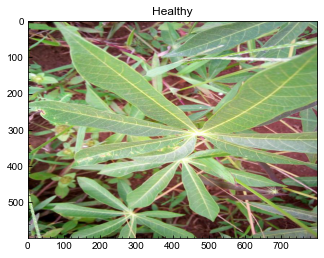

In [12]:
plot_image_with_label(42)

In [13]:
def plot_six_by_class(cl):
    
    #get six random indices belonging to the selected class
    indx = train_df[train_df['label'] == cl].sample(6, axis=0).image_id.values
    
    #plot
    fig, axes = plt.subplots(2,3, figsize=(12,6))
    axes = axes.flatten()
    for i, ax in enumerate(axes):
        ax.imshow(PIL.Image.open(train_dir + indx[i]))
    fig.suptitle(label_key[cl], fontsize=18)
    plt.tight_layout()
    plt.show()

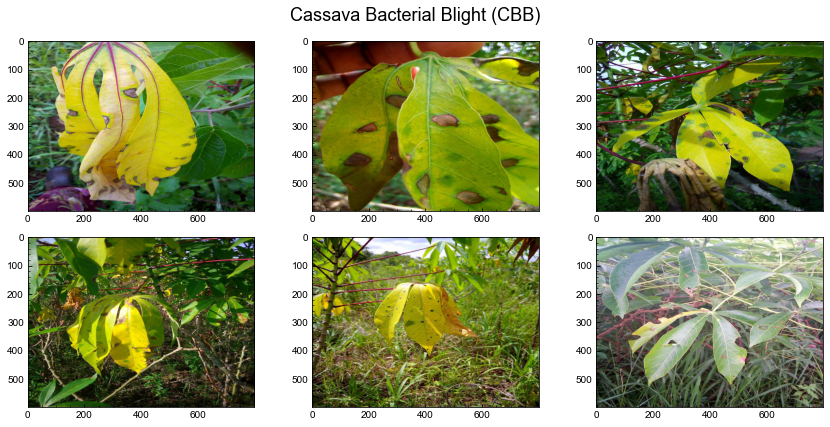

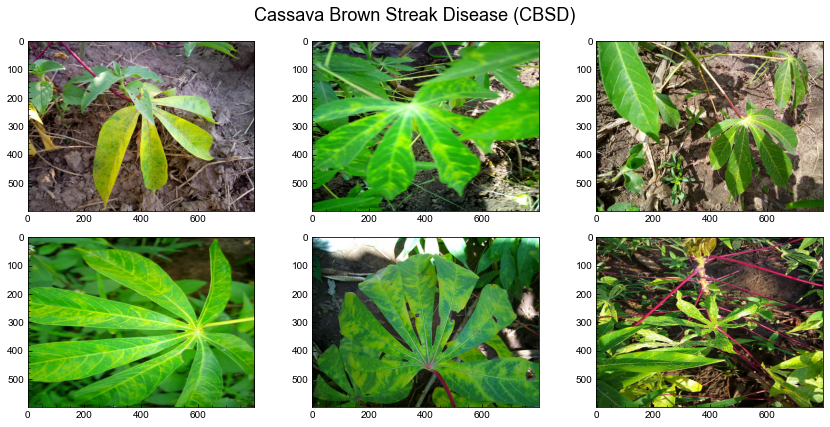

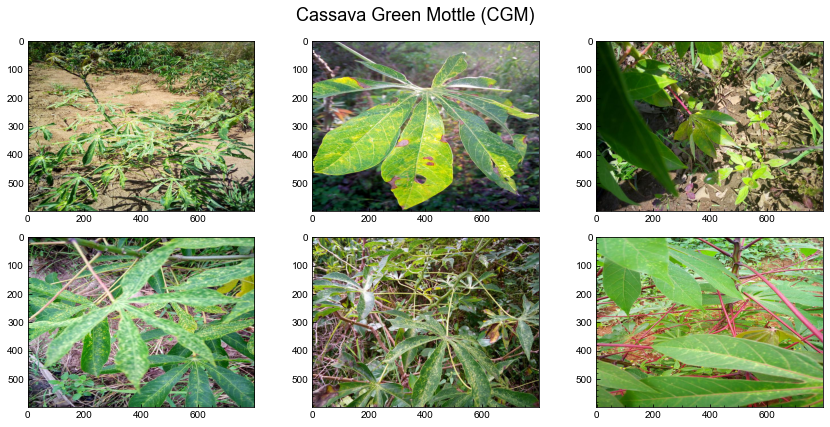

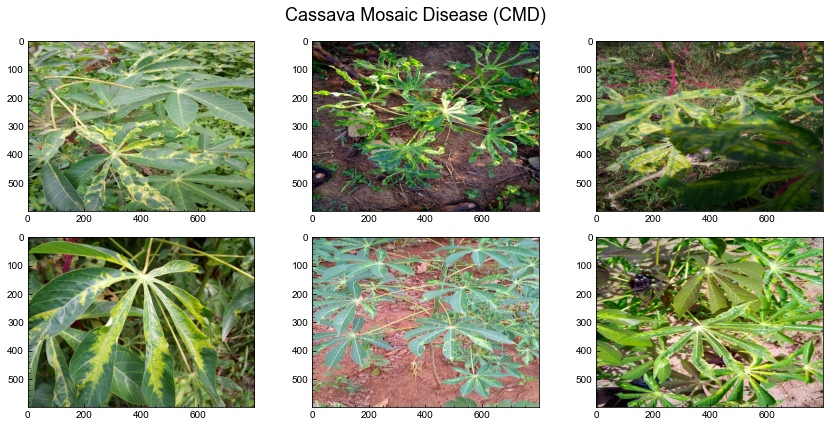

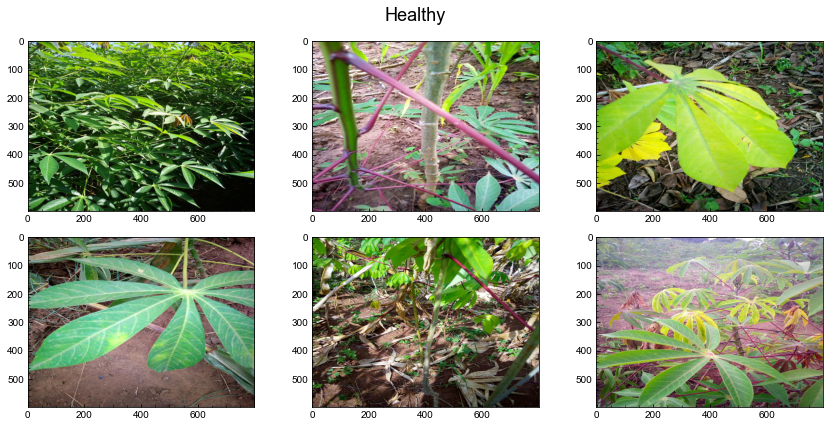

In [14]:
for i in range(5):
    plot_six_by_class(i)

Some of the images at this resolution are quite difficult to classify even with the human eye, although perhaps an expert in Cassava disease would not have this difficulty. Some of the features are quite small on the diseased plants. This suggests that a larger input image size (higher resolution) may be beneficial to preserve the ability to identify small features. Also some healthy plants, depending on the random batch chosen, can look yellow or wilted, making them look diseased. However a "healthy" plant in this context just means an "uninfected" plant - the plant may not be truly fluorishing. For the context of this classifiers application it makes sense that the healthy class should not be comprised of perfectly healthy plants. Why would a farmer need help classifying a plant with no problems? A farmer is more likely to need help classifying a plant that is languishing, so that they can determine if it is infected versus suffering from drought, etc.

## Class Distribution and Feature Engineering

In order to train a classifier that is balanced in its accuracy for all classes we will want a balanced training set. 

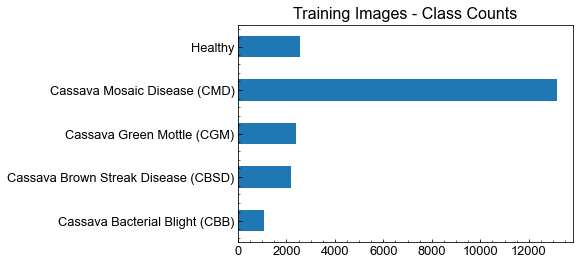

In [15]:
set_plot(16)
train_df.groupby('label').count().set_index(label_key).plot.barh(title='Training Images - Class Counts', legend=False)
plt.show()

In [16]:
# The data is clearly quite imbalanced. 
# We will want to resample the data to have balanced classes.

def balance_df(df, label='label', class_size=1000):
    
    """Resamples data frame containingclass labels so that every class has an equal class size. 
    Classes are sampled with replacement if they exceed the desired class size, and without 
    replacement if they do not.
        
    Inputs
    - df : name of dataframe containing sample data. 
    - label : name of column containing one-hot encoded class labels.
    - class_size : desired size of each class after resampling.

    Returns
    balanced_df - a dataframe with balanced classes."""
    
    balanced_df = pd.DataFrame()
    n_classes = df[label].nunique()
    
    for i in range(n_classes):
        one_class = df[df[label] == i]
        if len(one_class) >= 2000:
            replace=False
        else:
            replace=True
        
        idx = np.random.choice(df[df[label] == i].index, size=class_size, replace=replace)
        temp = df.iloc[idx]
        balanced_df = pd.concat([balanced_df, temp])

    balanced_df = balanced_df.sample(frac=1).reset_index().rename(columns={'index':'old_index'})

    return balanced_df

In [17]:
balanced_df = balance_df(train_df, class_size=2000)

In [18]:
balanced_df.head()

,old_index,image_id,label
0,20642,848032997.jpg,3
1,6999,2251583230.jpg,1
2,17619,4173521076.jpg,0
3,9574,2698127956.jpg,0
4,11034,2967030825.jpg,0


In [19]:
balanced_df.label.value_counts()

0    2000
1    2000
2    2000
3    2000
4    2000
Name: label, dtype: int64

The old index can be used to devise a unique test set.

In [20]:
test_df = pd.DataFrame()

for i in range(5):
    temp = train_df.drop(index=balanced_df.old_index)
    temp = temp[temp.label == i]
    
    if len(temp) >= 200:
        replace=False
    else:
        replace=True
    sample = temp.sample(200, replace=replace)
    test_df = pd.concat([test_df, sample])

test_df = test_df.sample(frac=1).reset_index(drop=True)
test_df.head()

,image_id,label
0,1258586775.jpg,0
1,2497412230.jpg,3
2,2694336156.jpg,1
3,3419650756.jpg,2
4,4005310479.jpg,0


In [21]:
test_df.label.value_counts()

0    200
1    200
2    200
3    200
4    200
Name: label, dtype: int64

We can use keras's built-in ImageDataGenerator class to randomly augment batches of image data. We will select augmentation methods that reflect the data variability we would expect from pictures taken by farmers in the field. This includes:

 * rotation - cameras can be held at any angle relative to the plant
 * brightness - pictures can be taken in shadow or bright direct sunlight
 * zoom range - there is no standard distance from which these images would be taken

We will also include augmentation to serve as a regularizing effect. Since image distortions are randomly selected every time a batch is generated this means a given image may have slightly different alterations each epoch, providing an effectively new or partially new training set each iteration. Shearing, height and width shift, channel shift, and flipping are all methods for slightly altering the images such that the output still contains meaningful features that one would expect to encounter in different test images.

Finally the images will be rescaled so that pixel values lie in a 0 to 1 range.

In [22]:
data_gen = ImageDataGenerator(
    rotation_range=360,
    brightness_range=[0.5, 1.2],
    shear_range=25,
    zoom_range=0.2,
    height_shift_range=0.1,
    width_shift_range=0.1,
    channel_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.15,
    rescale=1/255)

In [23]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

# for keras imagedatagenerator class labels must be strings
balanced_df['class'] = balanced_df['label'].apply(lambda x: label_key.iloc[x])

In [24]:
train_gen = data_gen.flow_from_dataframe(
                            balanced_df, 
                            train_dir, 
                            x_col='image_id', 
                            y_col='class', 
                            target_size=(IMAGE_SIZE,IMAGE_SIZE),
                            color_mode='rgb',
                            class_mode='categorical',
                            batch_size=BATCH_SIZE,
                            shuffle=True,
                            seed=1,
                            subset='training')

Found 8500 validated image filenames belonging to 5 classes.


In [25]:
def plot_batch(dfiterator):
    
    """Plots the next batch of images and labels in a keras dataframe iterator."""
    
    bs = dfiterator.batch_size
    images, labels = next(dfiterator)
    rows = int(bs / 4) + int(bs % 4 > 0)
    fig, axes = plt.subplots(rows, 4, figsize=(16, 4 * rows))
    axes = axes.flatten()
    for i, (img, label) in enumerate(zip(images, labels)):
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(label_key[np.argmax(label)])

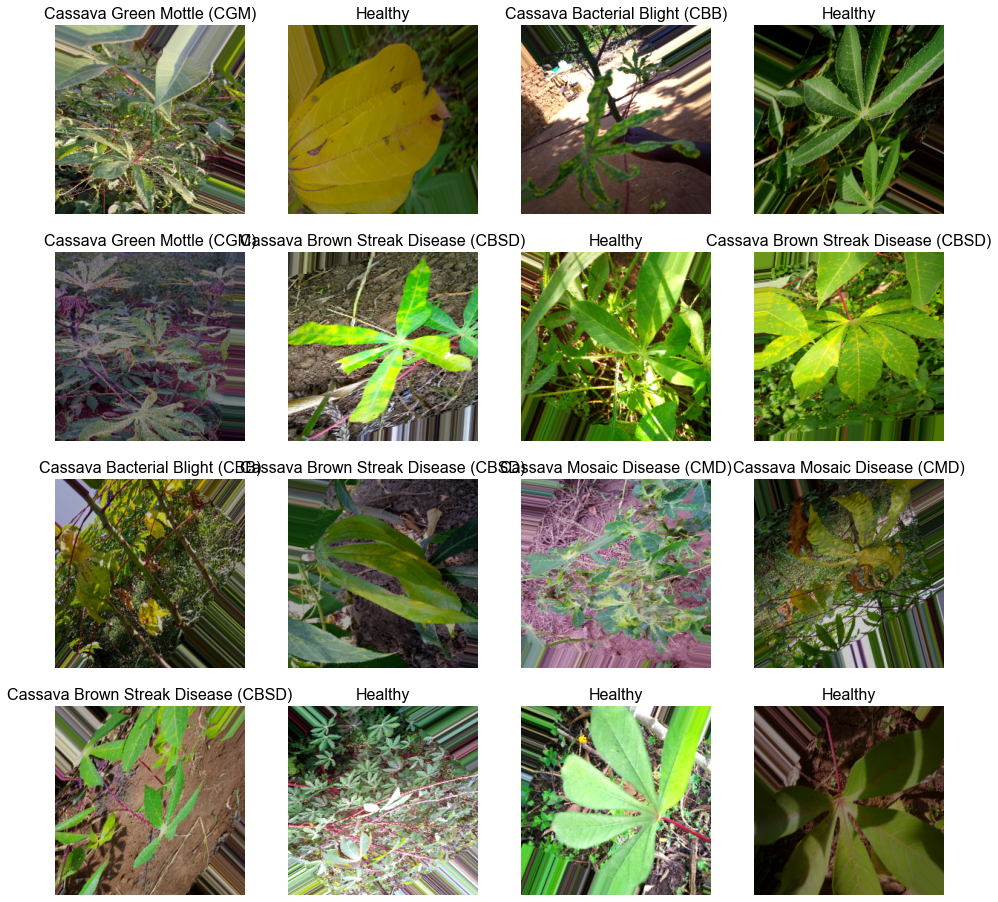

In [26]:
plot_batch(train_gen)

As you can see the images are randomly altered but still retain recognizable features. 

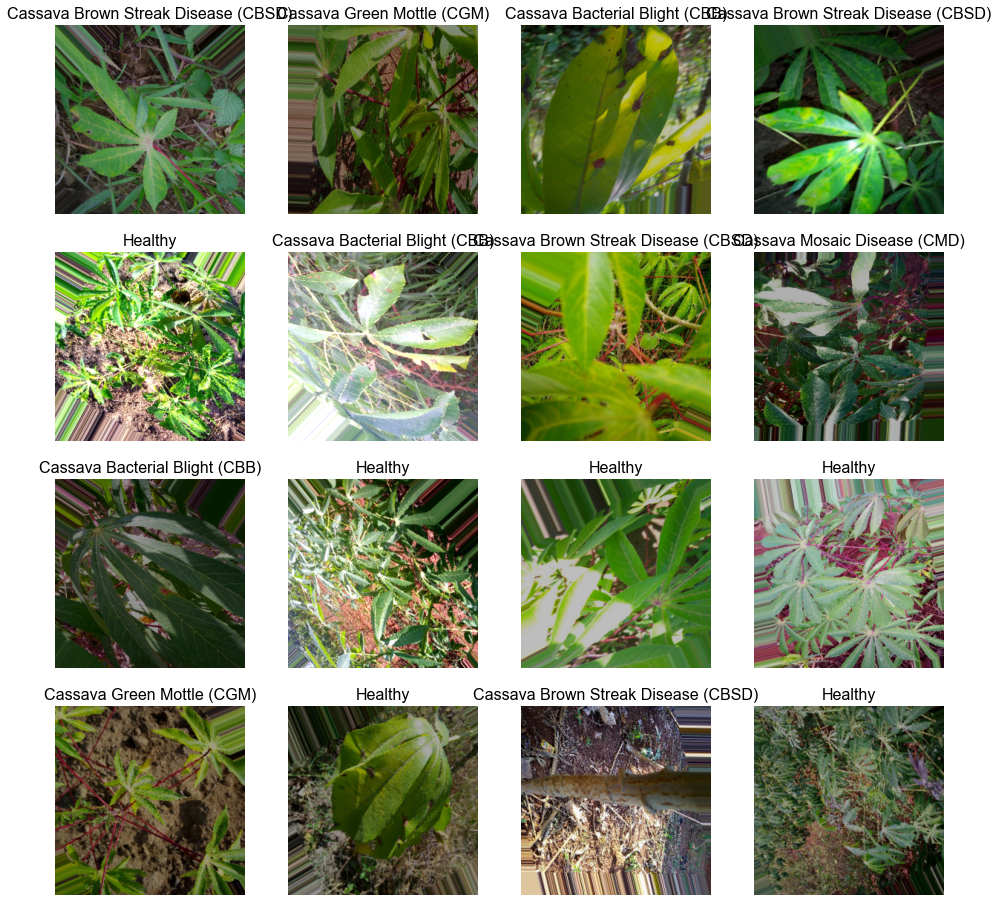

In [27]:
#plot another batch
plot_batch(train_gen)